In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
from collections import defaultdict
import re

import bs4
import requests

In [3]:
episodes = ['http://www.imsdb.com/scripts/Star-Wars-The-Phantom-Menace.html',
            'http://www.imsdb.com/scripts/Star-Wars-Attack-of-the-Clones.html',
            'http://www.imsdb.com/scripts/Star-Wars-Revenge-of-the-Sith.html',
            'http://www.imsdb.com/scripts/Star-Wars-A-New-Hope.html',
            'http://www.imsdb.com/scripts/Star-Wars-The-Empire-Strikes-Back.html',
            'http://www.imsdb.com/scripts/Star-Wars-Return-of-the-Jedi.html']

### Episode IV

In [4]:
res = requests.get(episodes[3])
soup = bs4.BeautifulSoup(res.content)

In [5]:
bolds = soup.findAll('b')

In [6]:
characters_4 = defaultdict(str)

In [7]:
for b in bolds:
    if len(b.text) - len(b.text.lstrip()) < 37:
        continue
    for t in b.nextSibling.split('\n'):
        if not t:
            break
        stripped = t.strip()
        if not stripped.startswith('('):
            characters_4[b.text.strip()] += ' ' + stripped

In [8]:
sorted(characters_4, key=lambda k: len(characters_4[k]), reverse=True)

[u'LUKE',
 u'HAN',
 u'THREEPIO',
 u'BEN',
 u'LEIA',
 u'BIGGS',
 u'VADER',
 u'TARKIN',
 u'OWEN',
 u'RED LEADER',
 u'DODONNA',
 u'JABBA',
 u'TROOPER',
 u'OFFICER',
 u'MOTTI',
 u'GREEDO',
 u'TAGGE',
 u'GOLD LEADER',
 u'WEDGE',
 u'AUNT BERU',
 u'VOICE',
 u'GOLD FIVE',
 u'FIRST TROOPER',
 u'FIXER',
 u'MASSASSI INTERCOM VOICE',
 u'INTERCOM VOICE',
 u'OFFICER CASS',
 u'RED TEN',
 u'SECOND OFFICER',
 u'HUMAN',
 u'COMMANDER',
 u"BEN'S VOICE",
 u'GANTRY OFFICER',
 u'IMPERIAL OFFICER',
 u'WILLARD',
 u'BARTENDER',
 u'DEATH STAR INTERCOM VOICE',
 u"RED LEADER'S VOICE",
 u'ASTRO-OFFICER',
 u'REBEL OFFICER',
 u'CONTROL OFFICER',
 u'CHIEF',
 u'BASE VOICE',
 u"MAN'S VOICE",
 u'CAPTAIN',
 u'BERU',
 u'CAMIE',
 u'GOLD TWO',
 u'SECOND TROOPER',
 u"LUKE'S VOICE",
 u"HAN'S VOICE",
 u"RED TEN'S VOICE",
 u'READ LEADER',
 u'TECHNICIAN',
 u'WOMAN',
 u'CREATURE',
 u'FIRST OFFICER',
 u'CHIEF PILOT',
 u'RED ELEVEN',
 u'RED SEVEN',
 u'DEAK',
 u'RED NINE',
 u'PORKINS',
 u'TROOPER VOICE',
 u"RED NINE'S VOICE",
 u"WING

In [9]:
#chosen = ['LUKE', 'HAN', 'THREEPIO', 'BEN', 'LEIA', 'VADER', 'TARKIN']
#characters = dict([(k, v) for k, v in characters.iteritems() if k in chosen])
#characters.keys()

In [10]:
def merge_entries(dic, tuples):
    for keep, drop in tuples:
        dic[keep] += ' ' + dic[drop]
        del dic[drop]
    return dic

In [11]:
characters_4 = merge_entries(characters_4, [('BEN', 'BEN\'S VOICE'),
                                            ('HAN', 'HAN\'S VOICE'),
                                            ('LUKE', 'LUKE\'S VOICE')])

### Episode V

In [12]:
res = requests.get(episodes[4])
soup = bs4.BeautifulSoup(res.content)

In [13]:
bolds = soup.findAll('b')

In [14]:
# i = 12
# print len(bolds[i].text) - len(bolds[i].text.lstrip())
# bolds[i]

In [15]:
characters_5 = defaultdict(str)

In [16]:
for b in bolds:
    if len(b.text) - len(b.text.lstrip()) != 4:
        continue
    for t in b.nextSibling.split('\n'):
        if not t:
            break
        stripped = t.strip()
        if not stripped.startswith('('):
            characters_5[b.text.strip()] += ' ' + stripped

In [17]:
sorted(characters_5, key=lambda k: len(characters_5[k]), reverse=True)

[u'HAN',
 u'THREEPIO',
 u'LUKE',
 u'LEIA',
 u'VADER',
 u'LANDO',
 u'YODA',
 u'PIETT',
 u'CREATURE',
 u'RIEEKAN',
 u'BEN',
 u'VEERS',
 u'NEEDA',
 u'DECK OFFICER',
 u'ZEV',
 u'OZZEL',
 u'EMPEROR',
 u'DACK',
 u'WEDGE',
 u'CONTROLLER',
 u'REBEL CAPTAIN',
 u'DERLIN',
 u'BOBA FETT',
 u'ANNOUNCER',
 u"BEN'S VOICE",
 u'INTERCOM VOICE',
 u'TRACKING OFFICER',
 u'LIEUTENANT',
 u'MEDICAL DROID',
 u'JANSON',
 u'COMMUNICATIONS OFFICER',
 u'TRENCH OFFICER',
 u'SENIOR CONTROLLER',
 u'SECOND CONTROLLER',
 u'ASSISTANT OFFICER',
 u'IMPERIAL OFFICER',
 u'IMPERIAL SOLDIER',
 u'HOBBIE',
 u'HEAD CONTROLLER',
 u'CAPTAIN',
 u'WOMAN CONTROLLER',
 u'PILOT',
 u'STRANGE VOICE',
 u'OFFICER',
 u'PILOTS',
 u"MAN'S VOICE",
 u'REBEL FIGHTER',
 u'SECOND OFFICER',
 u'FIRST CONTROLLER',
 u'SECOND THREEPIO']

In [18]:
characters_5 = merge_entries(characters_5, [('BEN', 'BEN\'S VOICE')])

### Episode VI

In [19]:
res = requests.get(episodes[5])
soup = bs4.BeautifulSoup(res.content)

In [20]:
bolds = soup.findAll('b')
bolds = bolds[5:]

In [21]:
from bs4.element import NavigableString

In [22]:
characters_6 = defaultdict(str)

In [23]:
for i, b in enumerate(bolds):
    if b.text[0].isdigit():
        continue
    if type(b.nextSibling) != NavigableString:
        continue
    for t in b.nextSibling.split('\n'):
        if not t:
            break
        stripped = t.strip()
        if not stripped.startswith('('):
            c = b.text.strip().split('\t')[0]
            characters_6[c] += ' ' + stripped

In [24]:
sorted(characters_6, key=lambda k: len(characters_6[k]), reverse=True)

[u'THREEPIO',
 u'LUKE',
 u'HAN',
 u'EMPEROR',
 u'BEN',
 u'VADER',
 u'LANDO',
 u'LEIA',
 u'ACKBAR',
 u'YODA',
 u'MON MOTHMA',
 u'NINEDENINE',
 u'WEDGE',
 u'PIETT',
 u'COMMANDER',
 u'JERJERROD',
 u'GENERAL MADINE',
 u'BOUSHH',
 u'SHUTTLE CAPTAIN',
 u'HAN/PILOT',
 u'STORMTROOPER',
 u'BIB',
 u'GUARD',
 u'LURE',
 u'CONTROLLER',
 u'ANAKIN',
 u'REBEL PILOT',
 u'ACKBAR ',
 u'SCOUT #1',
 u'OFFICER',
 u'CONTROL ROOM COMMANDER',
 u'RED THREE',
 u'OOLA',
 u'JABBA',
 u'RED LEADER',
 u'SCOUT',
 u'BUNKER COMMANDER',
 u'GREEN LEADER',
 u'GRAY LEADER',
 u'PILOT #2',
 u'STRANGE VOICE',
 u'VOICE',
 u'PILOT',
 u'NAVIGATOR',
 u'SCOUT #2',
 u'OPERATOR',
 u'SECOND COMMANDER',
 u'Y-WING PILOT',
 u'RED TWO',
 u'WALKER PILOT #1',
 u'Genres',
 u'Writers']

#### Episode I

In [25]:
res = requests.get(episodes[0])
soup = bs4.BeautifulSoup(res.content)

In [26]:
bod = soup.find('body')
raw = soup.findAll('pre')[0]

In [27]:
characters_1 = defaultdict(str)

In [28]:
for child in raw.children:
    if type(child) != NavigableString:
        continue
    l = child.split('\n\n')
    for s in l:
        content_list = s.split(':')
        if len(content_list) == 1:
            continue
        if content_list[0].isupper():
            # remove text in brackets
            content = re.sub(r'\([^)]*\)', '', ' '.join(content_list[1:])).strip()
            characters_1[content_list[0].strip()] += ' ' + content

In [29]:
sorted(characters_1, key=lambda k: len(characters_1[k]), reverse=True)

[u'QUI-GON',
 u'ANAKIN',
 u'OBI-WAN',
 u'CAPT. PANAKA',
 u'JAR JAR',
 u'PADME',
 u'PALPATINE',
 u'NUTE',
 u'WATTO',
 u'YODA',
 u'SHMI',
 u'AMIDALA',
 u'DARTH SIDIOUS',
 u'BOSS NASS',
 u'RUNE',
 u'B',
 u'THREEPIO',
 u'BIBBLE',
 u'RIC OLIE',
 u'KITSTER',
 u'DARTH MAUL',
 u'A',
 u'MACE WINDU',
 u'SEBULBA',
 u'JIRA',
 u'(O.S) A',
 u'BAIL ORGANA',
 u'CAPTAIN',
 u'BRAVO TWO',
 u'JABBA',
 u'TEY HOW',
 u'PANAKA',
 u'LOTT DOD',
 u'AKS MOE',
 u'BATTLE DROID CAPTAIN',
 u'GUARD DROID',
 u'TC-14',
 u'OOM-9',
 u'GUARD',
 u'PK-4',
 u'VALORUM',
 u'EG-9',
 u'SABE',
 u'FIGHTER PILOT',
 u'WALD',
 u'CAPT. TARPALS',
 u'GUNGAN LOOKOUT',
 u'TITLE CARD',
 u'GENERAL CEEL',
 u'ANAKN',
 u'VENDOR',
 u'P-59',
 u'MAS AMEDDA',
 u'ASSEMBLY',
 u'OWO-1',
 u'TC14',
 u'BATTLE DROID 3B3']

In [30]:
characters_1 = merge_entries(characters_1, [('ANAKIN', 'ANAKN'),
                                            ('AMIDALA', 'PADME')])

#### Episode II

In [31]:
res = requests.get(episodes[1])
soup = bs4.BeautifulSoup(res.content)

In [32]:
bolds = soup.findAll('b')

In [33]:
characters_2 = defaultdict(str)

In [34]:
for b in bolds:
    if len(b.text) - len(b.text.lstrip()) != 4:
        continue
    for t in b.nextSibling.split('\n'):
        if len(t) - len(t.lstrip()) != 3:
            continue
        stripped = t.strip()
        characters_2[b.text.strip()] += ' ' + stripped

In [35]:
sorted(characters_2, key=lambda k: len(characters_2[k]), reverse=True)

[u'ANAKIN',
 u'PADM\xc9',
 u'OBI-WAN',
 u'PADME',
 u'PALPATINE',
 u'MACE WINDU',
 u'YODA',
 u'LAMA SU',
 u'JAR JAR',
 u'JOCASTA NU',
 u'C-3PO',
 u'COUNT DOOKU',
 u'DOOKU',
 u'DEXTER JETTSTER',
 u'QUEEN JAMILLIA',
 u'TAUN WE',
 u'WATTO',
 u'CLIEGG',
 u'SIO BIBBLE',
 u'MAS AMEDDA',
 u'BAIL ORGANA',
 u'SOLA',
 u'CAPTAIN TYPHO',
 u'JOBAL',
 u'PK-4',
 u'RUWEE',
 u'SENATOR ASK AAK',
 u'OWEN',
 u'JANGO',
 u'JANGO FETT',
 u'POGGLE',
 u'OBI-WAN (V.O.)',
 u'SUN RIT',
 u'SHMI',
 u'NUTE GUNRAY',
 u'ORN FREE TAA',
 u'MACE',
 u'KI-ADI-MUNDI',
 u'AMIDALA',
 u'WINDU',
 u'ZAM WESSEL',
 u'AMBASSADOR DARSANA',
 u'HERMIONE BAGWA',
 u'DORME',
 u'DARTH SIDIOUS',
 u'CLIEGG (O.S.)',
 u'CHILDREN',
 u'BOBA FETT',
 u'ELAN',
 u'JOVAL',
 u'MACE-WINDU',
 u'CLONE CAPTAIN',
 u'JEDI CHILD JACK',
 u'JEDI CHILD MAY',
 u'BERU (V.O.)',
 u'CORD\xc9',
 u'DAR WAC',
 u'PLO KOON',
 u'RYOO & POOJA',
 u'ZAM',
 u'PAMDE',
 u'ELAN SLEAZEBAGGANO',
 u'OBI-WAM',
 u'SERVER',
 u'DROID CAPTAIN',
 u'BOBA',
 u'FOOD SERVER',
 u'HERMIONE',
 

In [36]:
characters_2 = merge_entries(characters_2, [('AMIDALA', 'PADME'),
                                            ('AMIDALA', u'PADM\xc9'),
                                            ('AMIDALA', 'PAMDE'),
                                            ('THREEPIO', 'C-3PO'),
                                            ('OBI-WAN', 'OBI-WAM'),
                                            ('OBI-WAN', 'OBI-WAN (V.O.)')])

## Episode III

In [37]:
res = requests.get(episodes[2])
soup = bs4.BeautifulSoup(res.content)

In [38]:
bod = soup.find('body')

In [39]:
characters_3 = defaultdict(str)

In [40]:
for b in bod.text.split('\n\n'):
    content_list = b.split(':')
    if len(content_list) == 1:
        continue
    if content_list[0].isupper():
            # remove text in brackets
            content = re.sub(r'\([^)]*\)', '', ' '.join(content_list[1:])).strip()
            characters_3[content_list[0].strip()] += ' ' + content

In [41]:
sorted(characters_3, key=lambda k: len(characters_3[k]), reverse=True)

[u'ANAKIN',
 u'OBI-WAN',
 u'PALPATINE',
 u'PADME',
 u'YODA',
 u'BAIL ORGANA',
 u'GENERAL GRIEVOUS',
 u'C-3PO',
 u'MACE',
 u'MON MOTHMA',
 u'CLONE COMMANDER CODY',
 u'COUNT DOOKU',
 u'DARTH SIDIOUS',
 u'NUTE GUNRAY',
 u'MEDICAL DROID',
 u'QUI -GON',
 u'QUI-GON',
 u'PILOT',
 u'CLONE SERGEANT',
 u'DARTH VADER',
 u'MACE WINDU',
 u'MAS AMEDDA',
 u'GUARD',
 u'ODD BALL',
 u'CAPTAIN ANTILLES',
 u'GIDDEAN DANU',
 u'BANA BREEMU',
 u'CLONE COMMANDER GREE',
 u'CAPTAIN TYPHO',
 u'FANG ZAR',
 u'CREATURE',
 u'JAR JAR',
 u'CLONE PILOT 2',
 u'SUPER BATTLE DROID G21',
 u'CLONE CAPTAIN',
 u'WRANGLER',
 u'SUPER BATTLE DROID 1',
 u'BODYGUARD',
 u'YOUNGLINGS',
 u'BODYGUARD I',
 u'CLONE COMMANDER THIRE',
 u'AAYLA',
 u'CLONE TROOPER',
 u'PLO KOON',
 u'CAPTAIN',
 u'DABTH SIDIOUS',
 u'BATTLE DROID',
 u'CLONE COMMANDER BACARA',
 u'SUPER BATTLE DROID',
 u'SUPER BATTLE DROID R77',
 u'RUNE HAAKO',
 u'SUPER BATTLE DROID 2',
 u'DROID 1',
 u'STAR WARS EPISODE 3',
 u'CLONE PILOT',
 u'TERR TANEEL',
 u'AT-ST CLONE SERGEA

In [42]:
characters_3 = merge_entries(characters_3, [('AMIDALA', 'PADME'),
                                            ('THREEPIO', 'C-3PO'),
                                            ('QUI-GON', 'QUI -GON'),
                                            ('ANAKIN', 'ANAKINN')])

In [43]:
episodes_list = [characters_1, characters_2, characters_3, characters_4, characters_5, characters_6]

In [44]:
combined_episodes = defaultdict(str)
for ep in episodes_list:
    for k, v in ep.iteritems():
        combined_episodes[k] += ' ' + v

In [45]:
sorted(combined_episodes, key=lambda k: len(combined_episodes[k]), reverse=True)

[u'ANAKIN',
 u'OBI-WAN',
 u'AMIDALA',
 u'THREEPIO',
 u'LUKE',
 u'HAN',
 u'PALPATINE',
 u'YODA',
 u'QUI-GON',
 u'LEIA',
 u'BEN',
 u'VADER',
 u'JAR JAR',
 u'LANDO',
 u'CAPT. PANAKA',
 u'WATTO',
 u'BAIL ORGANA',
 u'NUTE',
 u'EMPEROR',
 u'BIGGS',
 u'MACE WINDU',
 u'SHMI',
 u'TARKIN',
 u'COUNT DOOKU',
 u'LAMA SU',
 u'OWEN',
 u'DARTH SIDIOUS',
 u'JOCASTA NU',
 u'DOOKU',
 u'GENERAL GRIEVOUS',
 u'BOSS NASS',
 u'MACE',
 u'PIETT',
 u'RED LEADER',
 u'JABBA',
 u'MON MOTHMA',
 u'ACKBAR',
 u'CREATURE',
 u'DODONNA',
 u'WEDGE',
 u'DEXTER JETTSTER',
 u'QUEEN JAMILLIA',
 u'TAUN WE',
 u'MAS AMEDDA',
 u'RUNE',
 u'RIEEKAN',
 u'OFFICER',
 u'CLIEGG',
 u'B',
 u'BIBBLE',
 u'TROOPER',
 u'RIC OLIE',
 u'KITSTER',
 u'DARTH MAUL',
 u'CAPTAIN TYPHO',
 u'SIO BIBBLE',
 u'MOTTI',
 u'GREEDO',
 u'VEERS',
 u'PK-4',
 u'TAGGE',
 u'A',
 u'CAPTAIN',
 u'NUTE GUNRAY',
 u'GOLD LEADER',
 u'COMMANDER',
 u'NEEDA',
 u'SOLA',
 u'SEBULBA',
 u'CLONE COMMANDER CODY',
 u'JIRA',
 u'JOBAL',
 u'NINEDENINE',
 u'RUWEE',
 u'MEDICAL DROID',
 u'

In [46]:
combined_episodes = merge_entries(combined_episodes, [#('OBI-WAN', 'BEN'),
                                                      ('MACE WINDU', 'MACE-WINDU'),
                                                      ('MACE WINDU', 'WINDU'),
                                                      ('DARTH VADER', 'VADER'),
                                                      ('COUNT DOOKU', 'DOOKU'),
                                                      ('CAPT. PANAKA', 'PANAKA'),
                                                      ('DARTH SIDIOUS', 'DABTH SIDIOUS')])

In [47]:
sorted(combined_episodes, key=lambda k: len(combined_episodes[k]), reverse=True)[:20]

[u'ANAKIN',
 u'OBI-WAN',
 u'AMIDALA',
 u'THREEPIO',
 u'LUKE',
 u'HAN',
 u'PALPATINE',
 u'YODA',
 u'QUI-GON',
 u'LEIA',
 u'BEN',
 u'DARTH VADER',
 u'JAR JAR',
 u'LANDO',
 u'CAPT. PANAKA',
 u'COUNT DOOKU',
 u'WATTO',
 u'BAIL ORGANA',
 u'NUTE',
 u'EMPEROR']

In [48]:
chosen = [u'OBI-WAN', u'ANAKIN', u'AMIDALA', u'THREEPIO', u'LUKE', u'HAN', u'PALPATINE', u'YODA', u'QUI-GON', u'LEIA',
          u'DARTH VADER', u'JAR JAR', u'LANDO', u'CAPT. PANAKA', u'COUNT DOOKU', 'EMPEROR', 'BEN']

In [49]:
characters = dict([(k, v) for k, v in combined_episodes.iteritems() if k in chosen])

#### Stopwords

In [50]:
with open('stopwords-1.csv') as f:
   stop_words = [x.strip() for x in f.read().split(',')]

In [51]:
import nltk
from nltk.corpus import stopwords
# nltk.download()

In [52]:
stop_words += stopwords.words('english')

In [53]:
with open('stopwords-2.csv') as f:
    extended_stopwords = [x.strip() for x in f.readlines()]
    extended_stopwords = [x for x in extended_stopwords if x]

In [54]:
stop_words += extended_stopwords

In [55]:
stop_words = set(stop_words)

In [56]:
import string
rm_punctuation_map = dict((ord(char), u' ') for char in string.punctuation)
repls = ('jar jar', 'jar-jar'), ('obi wan', 'obi-wan'), ('qui gon', 'qui-gon'), ('r2 d2', 'r2-d2'), \
    (u'padm\xe9', 'padme')
def string_cleaning(characters):
    cleaned = dict()
    for k, v in characters.iteritems():
        txt = v.translate(rm_punctuation_map).lower()
        txt = re.sub(r'\s+', ' ', txt)
        txt = reduce(lambda a, kv: a.replace(*kv), repls, txt)
        cleaned[k] = [word for word in txt.split(' ') if word not in stop_words]
    return cleaned

In [57]:
cleaned = string_cleaning(characters)

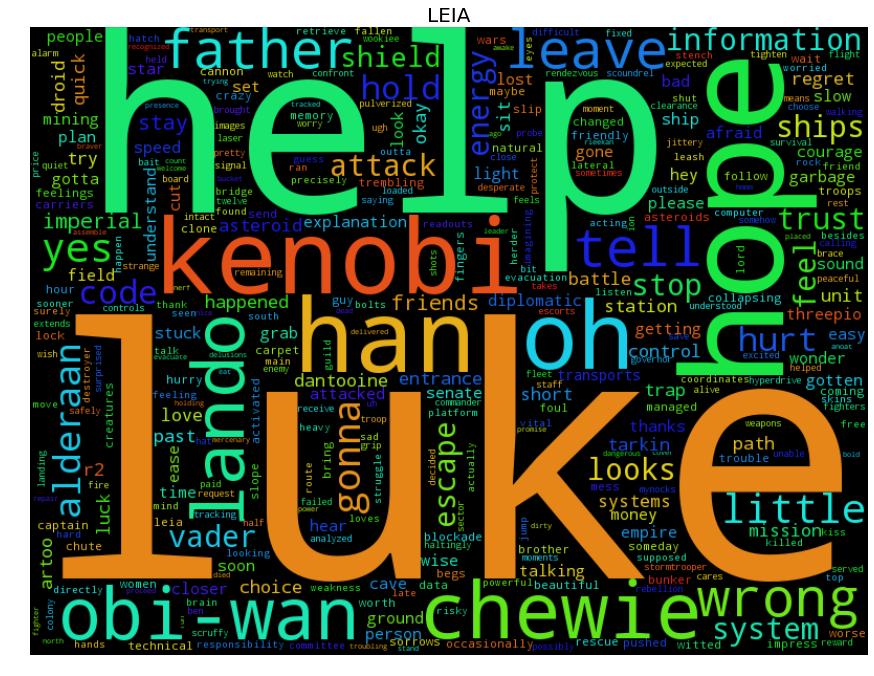

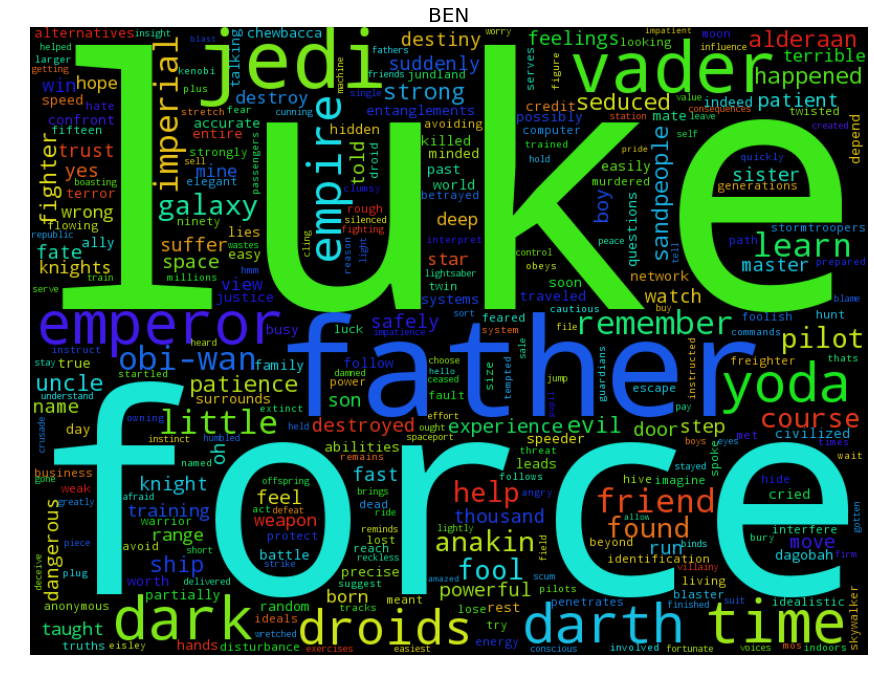

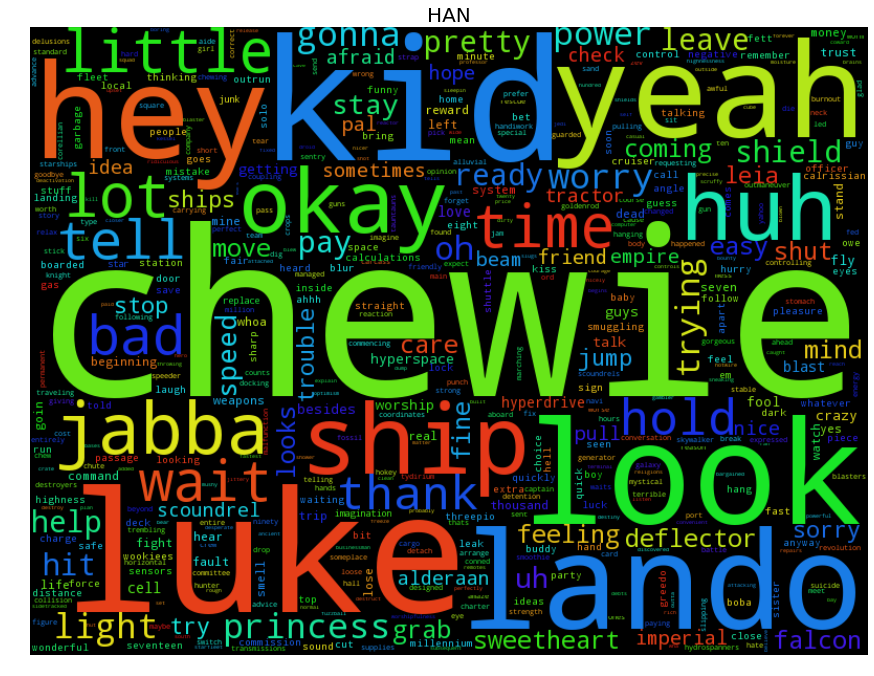

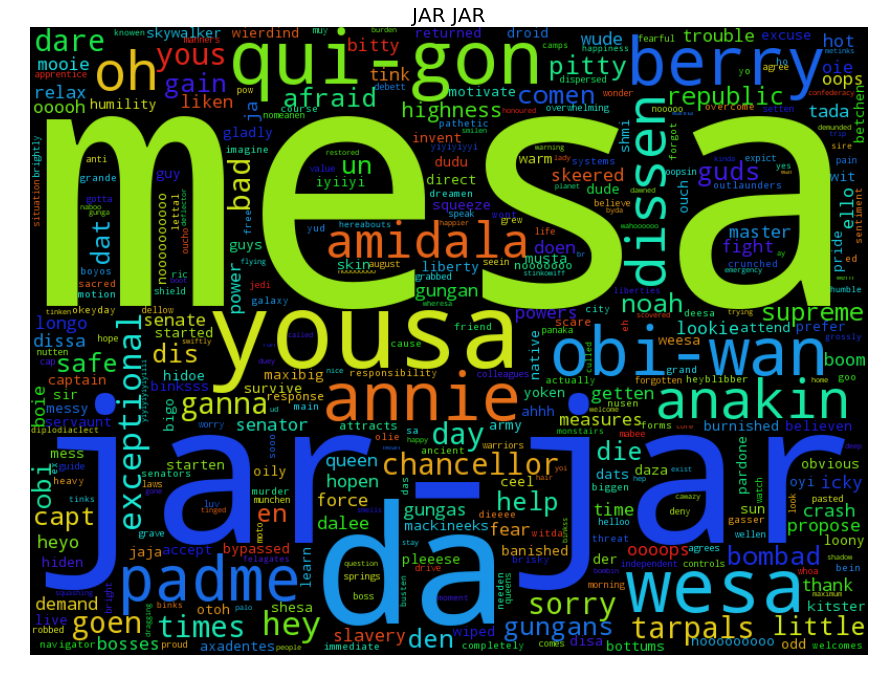

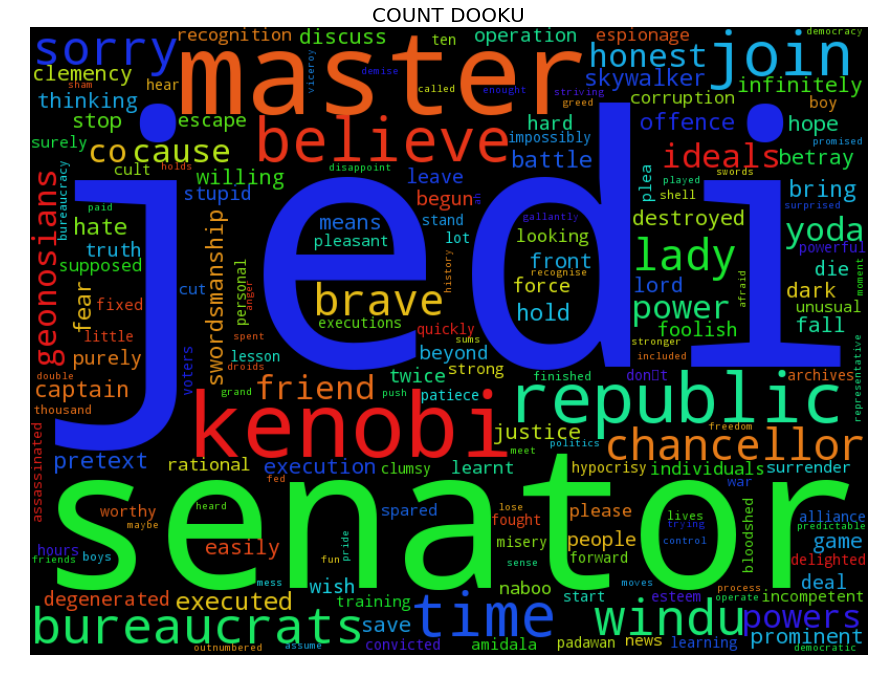

...

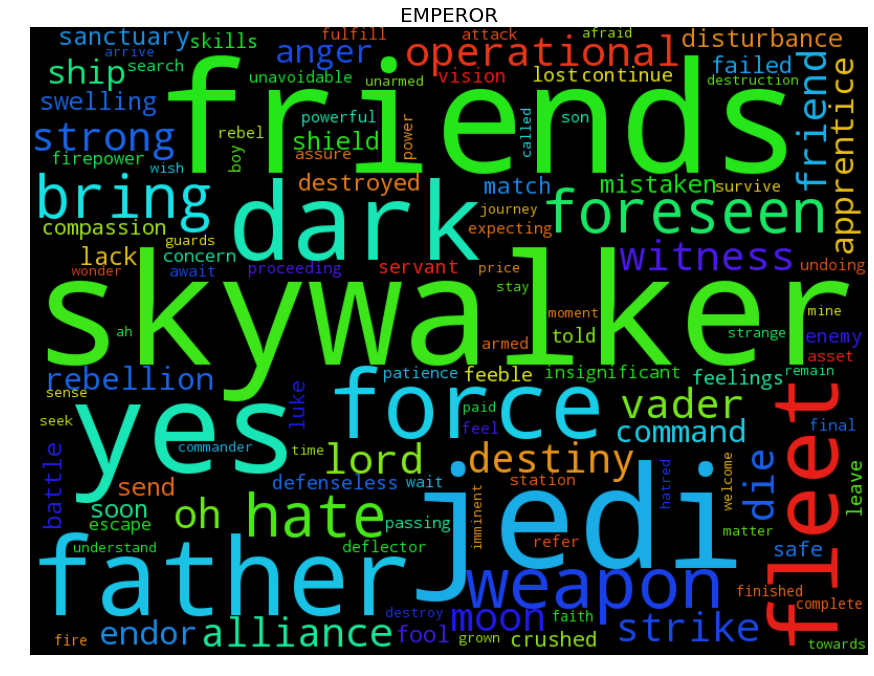

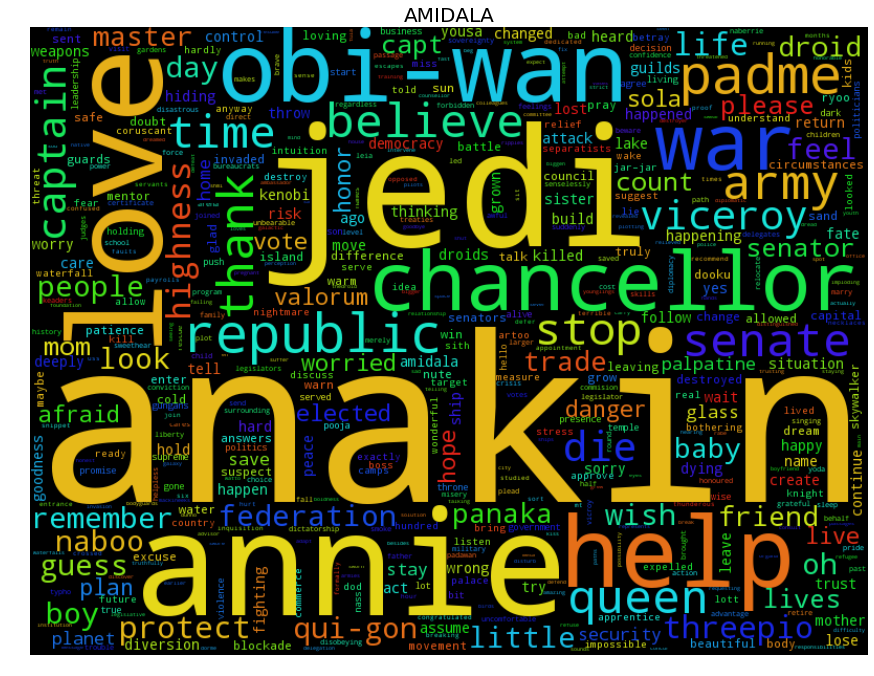

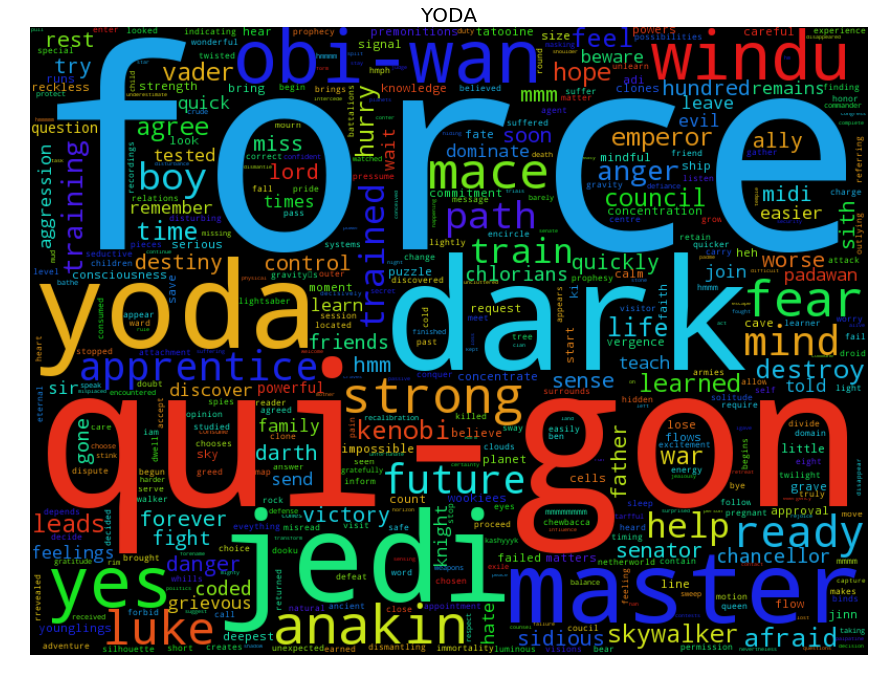

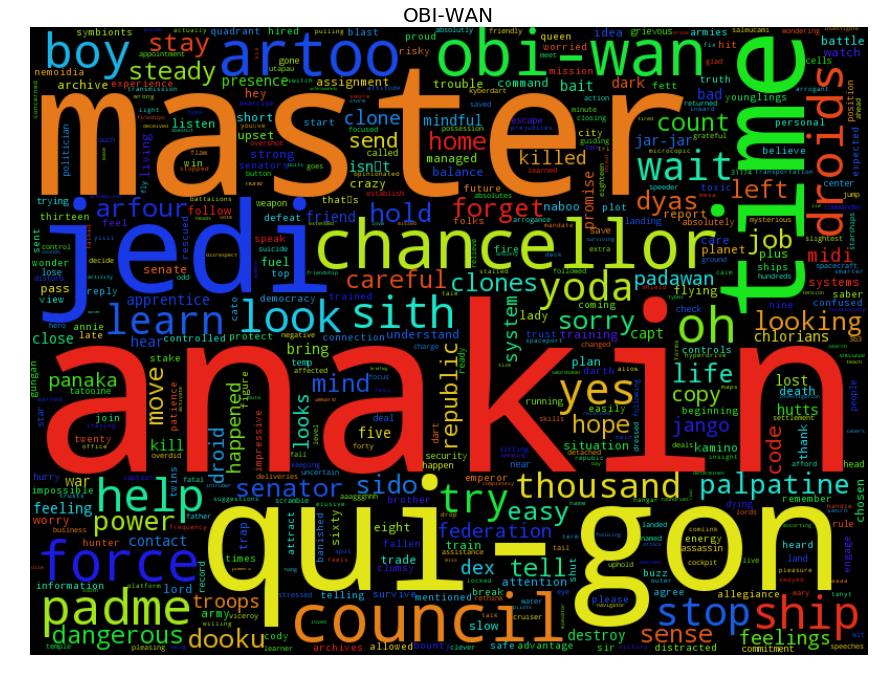

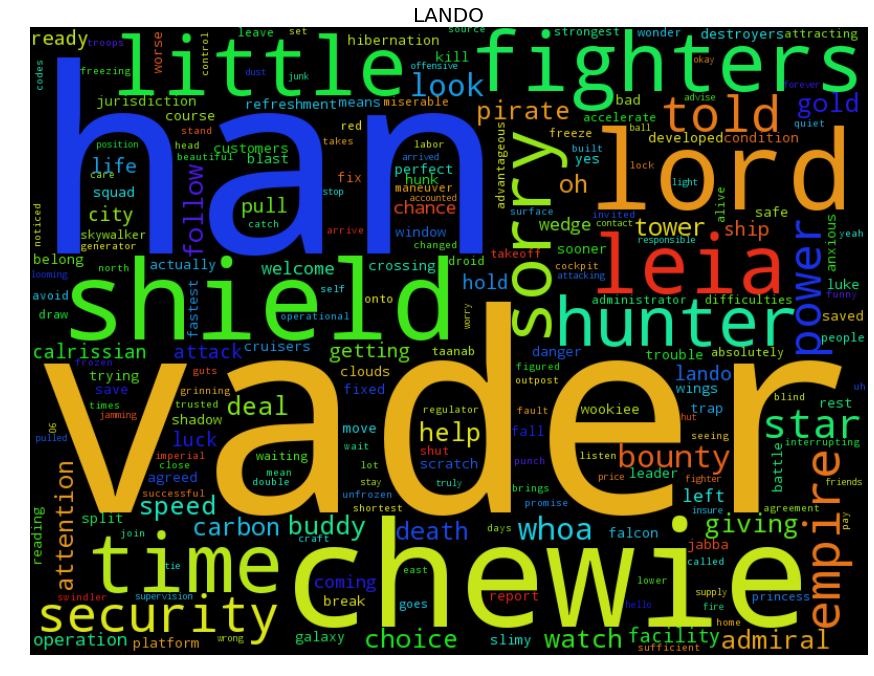

In [58]:
from collections import Counter
from os import path
import pylab as pl
%matplotlib inline
from wordcloud import WordCloud

for k, v in cleaned.iteritems():
    text = ' '.join(v)
    
    frequencies = Counter(text.split(' ')) 
    wordcloud = WordCloud(relative_scaling=.5, width=800, height=600,
                          max_words=500).generate_from_frequencies(frequencies.items())
    pl.figure(figsize=(15, 15))
    pl.imshow(wordcloud, cmap=pl.cm.gray)
    pl.axis('off')
    pl.title(k, fontsize=20)
    pl.show()

In [59]:
from random import randint
def green(word=None, font_size=None, position=None,
              orientation=None, font_path=None, random_state=None):
    return 'hsl(120, 100%, {}%)'.format(randint(0, 50))

In [60]:
def red(word=None, font_size=None, position=None,
        orientation=None, font_path=None, random_state=None):
    return 'hsl(0, 50%, {}%)'.format(randint(0, 50))

In [61]:
import numpy as np
from skimage.io import imread
from skimage.transform import resize

In [62]:
mask_names = {'LUKE': 'luke.png', 'HAN': 'han.png', 'DARTH VADER': 'vader.png', 'AMIDALA': 'padme.jpg',
              'OBI-WAN': 'obi_wan.jpg', 'YODA': 'yoda.png', 'EMPEROR': 'death_star.jpg', 'THREEPIO': 'threepio.png',
              'LANDO': 'cloud_city.jpg'}

In [63]:
bright = ['LUKE', 'HAN', 'AMIDALA', 'OBI-WAN', 'YODA', 'THREEPIO']

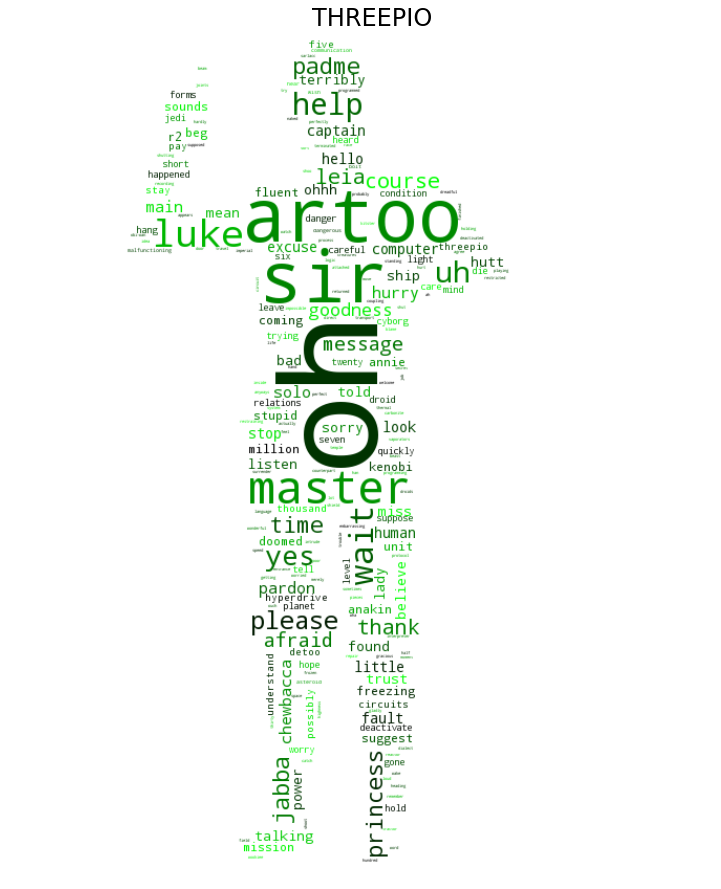

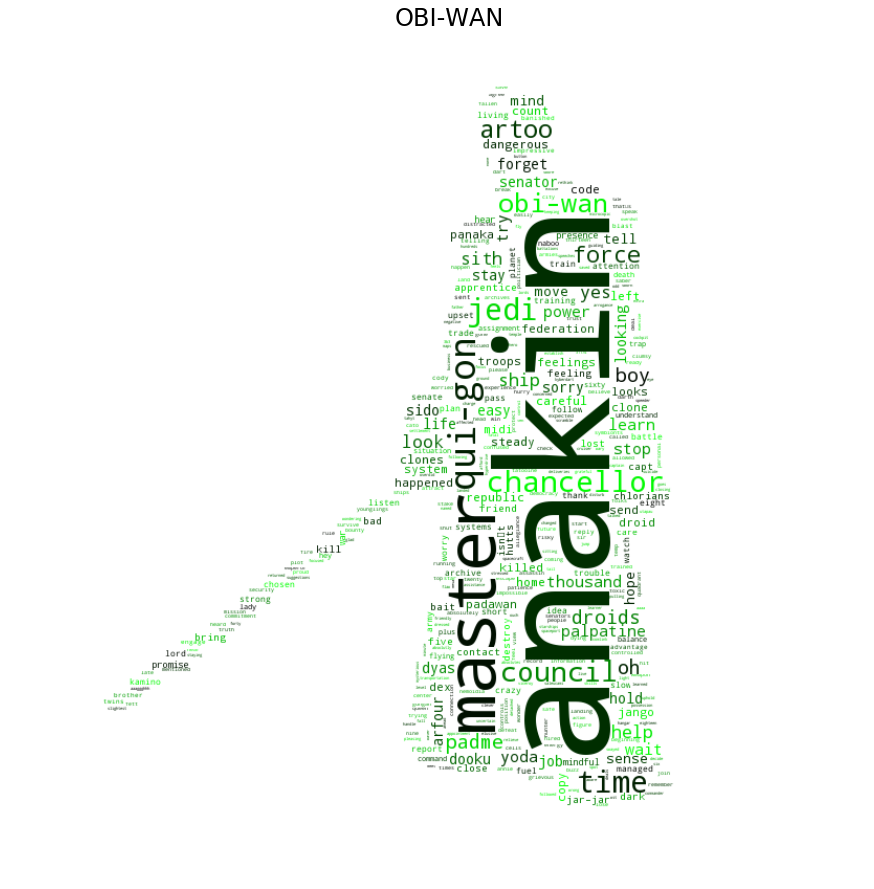

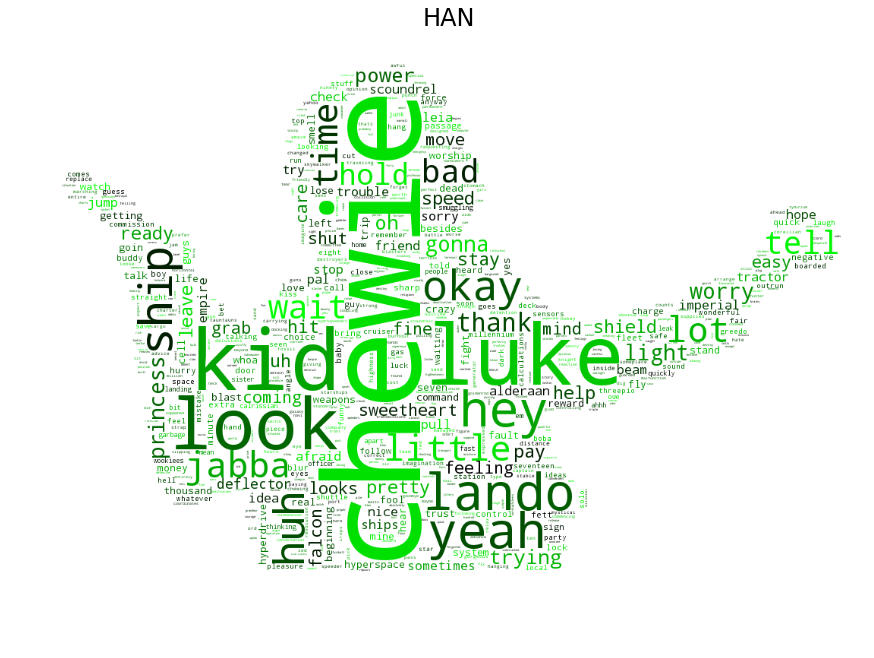

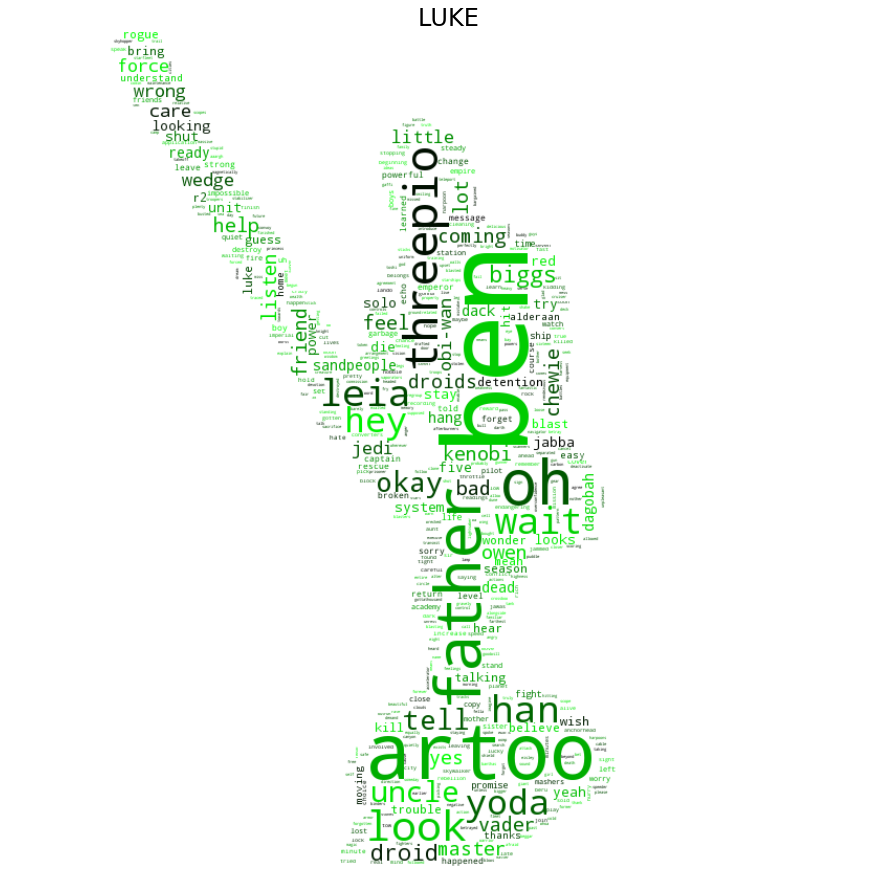

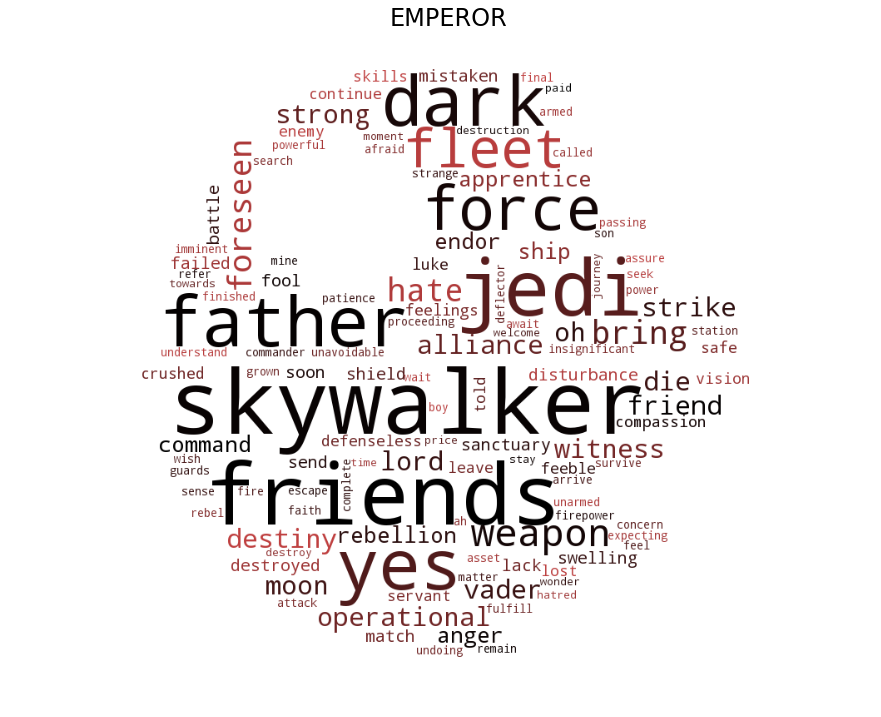

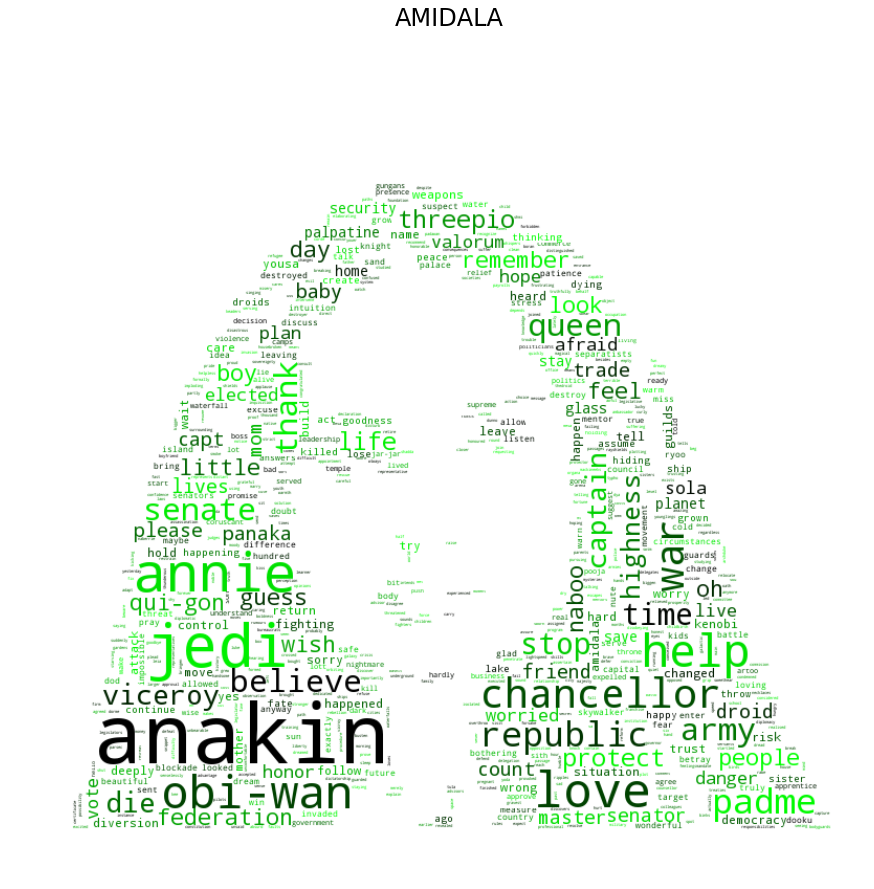

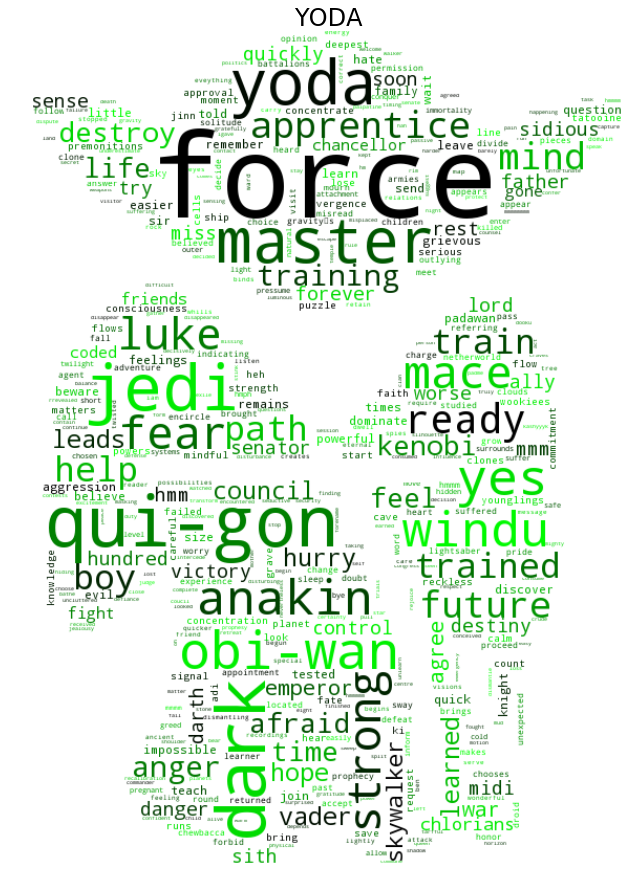

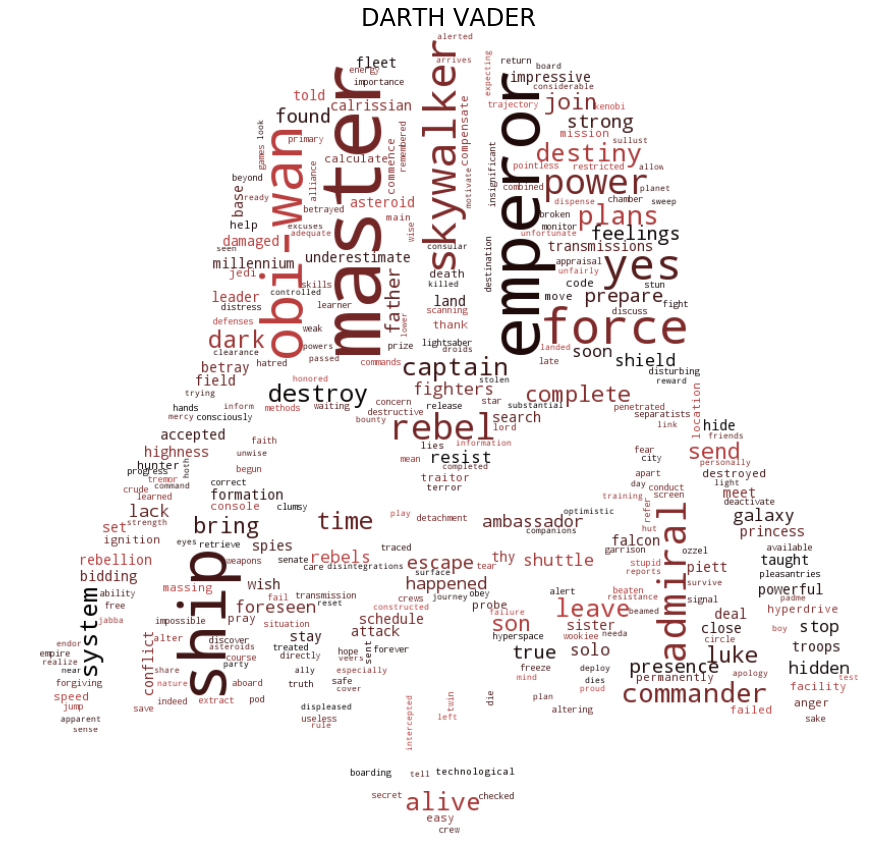

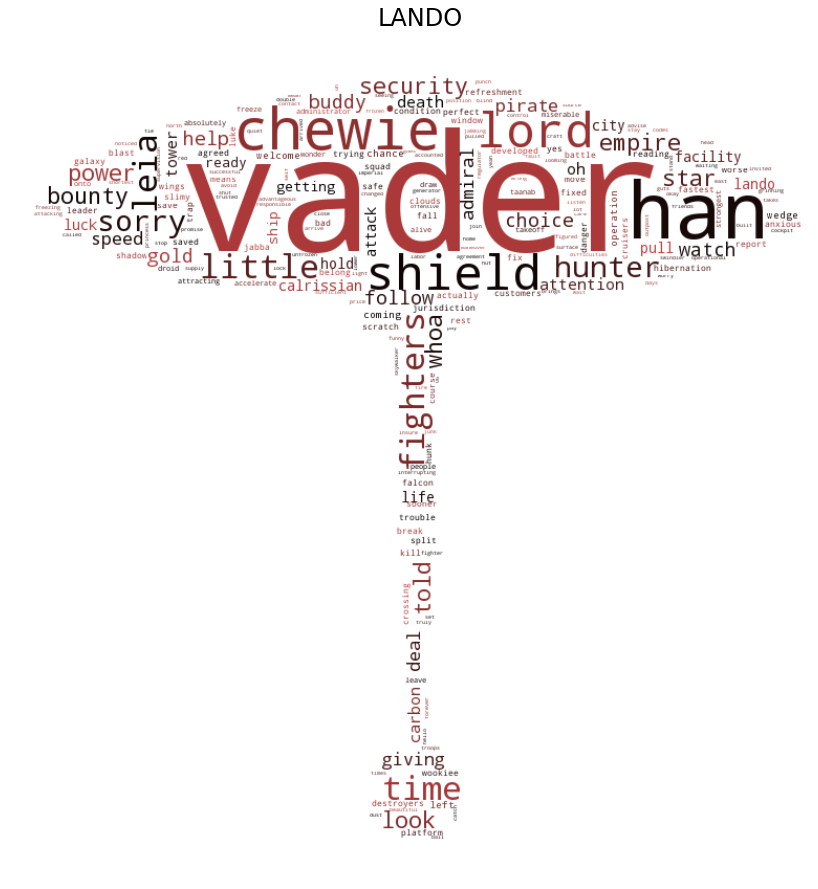

In [64]:
for name, fname in mask_names.iteritems():
    mask = imread('masks/' + fname)
    
    ratio = 800. / mask.shape[0]
    mask = resize(mask, (800, int(mask.shape[1] * ratio)), preserve_range=True)
    
    txt = cleaned[name]
    text = ' '.join(txt)
    
    if name in bright:
        bground = 'white'
        cfunc = green
    else:
        bground = 'white'
        cfunc = red

    frequencies = Counter(text.split(' ')) 
    wordcloud = WordCloud(relative_scaling=.5,
                          max_words=1000, mask=mask, background_color=bground,
                          color_func=cfunc).generate_from_frequencies(frequencies.items())
    pl.figure(figsize=(15, 15))
    pl.imshow(wordcloud, cmap=pl.cm.gray)
    pl.axis('off')
    pl.title(name, fontsize=24)
    pl.show()

### TF-IDF

In [65]:
import string
rm_punctuation_map = dict((ord(char), u' ') for char in string.punctuation)
repls = ('jar jar', 'jar-jar'), ('obi wan', 'obi-wan'), ('qui gon', 'qui-gon'), ('r2 d2', 'r2-d2'), \
    (u'padm\xe9', 'padme')
def string_cleaning(characters):
    cleaned = dict()
    for k, v in characters.iteritems():
        txt = v.translate(rm_punctuation_map).lower()
        txt = re.sub(r'\s+', ' ', txt)
        cleaned[k] = reduce(lambda a, kv: a.replace(*kv), repls, txt)
    return cleaned

In [66]:
cleaned = string_cleaning(characters)

In [67]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [68]:
vectorizer = TfidfVectorizer()

In [69]:
bla = vectorizer.fit_transform(cleaned.values())

In [70]:
blub = bla.toarray()

In [71]:
len(blub)

17

In [72]:
blub[0]

array([ 0.,  0.,  0., ...,  0.,  0.,  0.])

In [73]:
len(vectorizer.get_feature_names())

4197

In [74]:
idx = np.argsort(blub[-1])[::-1]

In [75]:
np.array(vectorizer.get_feature_names())[idx[:20]]

array([u'you', u'the', u'to', u'we', u'all', u'of', u'that', u'what',
       u'vader', u'han', u'right', u'it', u'and', u'they', u'chewie',
       u'll', u're', u'get', u'this', u'for'], 
      dtype='<U16')